# Bike Sharing Dataset: exploratory data analysis and prediction of the hourly utilitzation

### The dataset and its description can be found in https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset

From the "readme" file: "Bike-sharing rental process is highly correlated to the environmental and seasonal settings. For instance, weather conditions, precipitation, day of week, season, hour of the day, etc. can affect the rental behaviors. The core data set is related to the two-year historical log corresponding to years 2011 and 2012 from Capital Bikeshare system, Washington D.C., USA which is publicly available in http://capitalbikeshare.com/system-data. We aggregated the data on two hourly and daily basis and then extracted and added the corresponding weather and seasonal information."

### Here we predict via rergression modelling the bike rental count hourly based on environmental and seasonal settings

## Pre-processing

In [769]:
import pandas as pd
#A variable stored in an instance or class is called an attribute. A function stored in an instance or class is called a method.
df = pd.read_csv('Bike-Sharing-Dataset/hour.csv')
df

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


We have some categorical parameters (which can only take finite values) and non-categorical parameters (such as temperature and windspeed)

We drop columns 'instant' because it simply gives us an index of the entry.

In [770]:
#Drop instant columnd and date (which is made up of the other columns)
df = df.drop(['instant'], axis = 1)

From the column 'dteday' we keep only the precise day (maybe at the beginning of the month people tend to spend more money because the got the paycheck?). The year and month are already covered in other columns

In [771]:
date = df.dteday.values
day = pd.Series([int(d[-2:]) for d in date])
df['day'] = day
df = df.drop(['dteday'], axis = 1)

In [796]:
df[df.season == 2]['mnth'].unique()

array([3, 4, 5, 6])

In [773]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 16 columns):
season        17379 non-null int64
yr            17379 non-null int64
mnth          17379 non-null int64
hr            17379 non-null int64
holiday       17379 non-null int64
weekday       17379 non-null int64
workingday    17379 non-null int64
weathersit    17379 non-null int64
temp          17379 non-null float64
atemp         17379 non-null float64
hum           17379 non-null float64
windspeed     17379 non-null float64
casual        17379 non-null int64
registered    17379 non-null int64
cnt           17379 non-null int64
day           17379 non-null int64
dtypes: float64(4), int64(12)
memory usage: 2.1 MB


We see that the categorical data is stored in integers and the non-categorical in floats. This seems fine for our purposes.

In [774]:
#check if there's missing data
df.isna().any()

season        False
yr            False
mnth          False
hr            False
holiday       False
weekday       False
workingday    False
weathersit    False
temp          False
atemp         False
hum           False
windspeed     False
casual        False
registered    False
cnt           False
day           False
dtype: bool

In [775]:
df[df<0].count()

season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
day           0
dtype: int64

There are no negative or missing values 

### Plotting relationships

Two functions to plot histograms and average linear relationships

In [831]:
#Histograms of the features
import plotly.express as px
def histo_feature(df, x, z):
    '''
    z: input column with the data according to which the x will be split
    '''
    fig = px.histogram(df, x = df[x], nbins = 10, color = df[z], template = 'plotly_white',\
        marginal= 'violin', opacity = 0.75, barmode = 'group', histnorm = 'percent')

    fig.update_layout(
        font_size = 20,
        font_family='monospace',
        title=dict(text= 'cnt: total rented bikes / hour',x=0.53,y=0.95,
                font=dict(size=20)),
        legend=dict(x=1,y=0.96,borderwidth=0,tracegroupgap=5))
    fig.show()

#Linear
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from itertools import cycle

def mean_cnt_plot(df, x, z):
    '''
    Plots the mean cnt in y-axis with respect to a selected parameter
    x: x-axis parameter (e.g., hour, month...)
    z: input column with the data according to which the x will be split
    '''
    
    palette = cycle(px.colors.qualitative.Plotly)

    fig = go.Figure()

    for z_val, df_z in df.groupby(z):
        mean_count = []
        error = []
        unique_xval = []
        for xx, df_xx in df_z.groupby(x):
            unique_xval.append(xx)
            mean_count.append(df_xx['cnt'].mean())
            error.append(np.std(df_xx['cnt']) / np.sqrt(len(df_xx['cnt'])))
        
        #print(unique_xval)
        c = next(palette)
        fig.add_trace(go.Scatter(x = np.array(unique_xval), y = mean_count, error_y= dict( type='data',color = c,array=error,visible=True),\
            name = z_val, mode = 'lines',line=dict(color=c, width=4)))


    fig.update_layout(title='Average total (casual and registered) rental bikes per hour',
                   xaxis_title = x,
                   yaxis_title='Average rental bikes count')

        
    fig.show()



We create a df_labels dataframe with the values converted to labels. Only for easier visualization properties

In [797]:
df_labels = df.copy()
import sys
seasons = ['Winter', 'Spring', 'Summer', 'Fall']
for s in range(1,len(seasons) + 1):
    df_labels.season.replace(int(s), seasons[s-1], inplace = True)

#working day
w_day = ['no', 'yes']
for w in range(0,len(w_day)):
    df_labels.workingday.replace(w, w_day[w], inplace = True)


#year
yr_l = ['2011', '2012']
for y in range(0,len(yr_l)):
    df_labels.yr.replace(y, yr_l[y], inplace = True)


#holiday 
hol_l = ['no', 'yes']
for h in range(0,len(hol_l)):
    df_labels.holiday.replace(h, hol_l[h], inplace = True)

#weathersit 
weath_sit_l = ['clear', 'mist', 'light rain', 'heavy rain']
for s in range(1,len(weath_sit_l) + 1):
    df_labels.weathersit.replace(s, weath_sit_l[s-1], inplace = True)


#mnth 
month_l = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
for s in range(1,len(month_l) + 1):
    df_labels.mnth.replace(s, month_l[s-1], inplace = True)

#weekday 
weekday_l = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
for s in range(0,len(weekday_l)):
    df_labels.weekday.replace(s, weekday_l[s-1], inplace = True)


In [833]:
df_labels

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,day
0,Winter,2011,January,0,no,Saturday,no,clear,0.24,0.2879,0.81,0.0000,3,13,16,1
1,Winter,2011,January,1,no,Saturday,no,clear,0.22,0.2727,0.80,0.0000,8,32,40,1
2,Winter,2011,January,2,no,Saturday,no,clear,0.22,0.2727,0.80,0.0000,5,27,32,1
3,Winter,2011,January,3,no,Saturday,no,clear,0.24,0.2879,0.75,0.0000,3,10,13,1
4,Winter,2011,January,4,no,Saturday,no,clear,0.24,0.2879,0.75,0.0000,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,Winter,2012,December,19,no,Monday,yes,mist,0.26,0.2576,0.60,0.1642,11,108,119,31
17375,Winter,2012,December,20,no,Monday,yes,mist,0.26,0.2576,0.60,0.1642,8,81,89,31
17376,Winter,2012,December,21,no,Monday,yes,clear,0.26,0.2576,0.60,0.1642,7,83,90,31
17377,Winter,2012,December,22,no,Monday,yes,clear,0.26,0.2727,0.56,0.1343,13,48,61,31


In [834]:
#Here we average 'cnt' values over each hour during the different seasons
mean_cnt_plot(df_labels, 'hr', 'season')

In [835]:
mean_cnt_plot(df_labels, 'hr', 'mnth')

In [836]:
mean_cnt_plot(df_labels, 'season', 'yr')

In [837]:
mean_cnt_plot(df_labels, 'season', 'weathersit')

In [838]:
mean_cnt_plot(df_labels, 'hr', 'weathersit')

In [839]:
mean_cnt_plot(df_labels, 'hr', 'weekday')

In [789]:
histo_feature(df_labels, 'cnt','season')

In [788]:
histo_feature(df_labels, 'cnt','workingday')

In [787]:
histo_feature(df_labels, 'cnt','yr')

In [785]:
histo_feature(df_labels, 'cnt', 'holiday')

In [783]:
histo_feature(df_labels, 'cnt','mnth')

In [258]:
histo_feature(df_labels, 'weekday')

In [259]:
histo_feature(df_labels, 'weath_label')

Now plot the other non-categorical parameters (temperature, humidity, etc.) and see how they correlate with each other

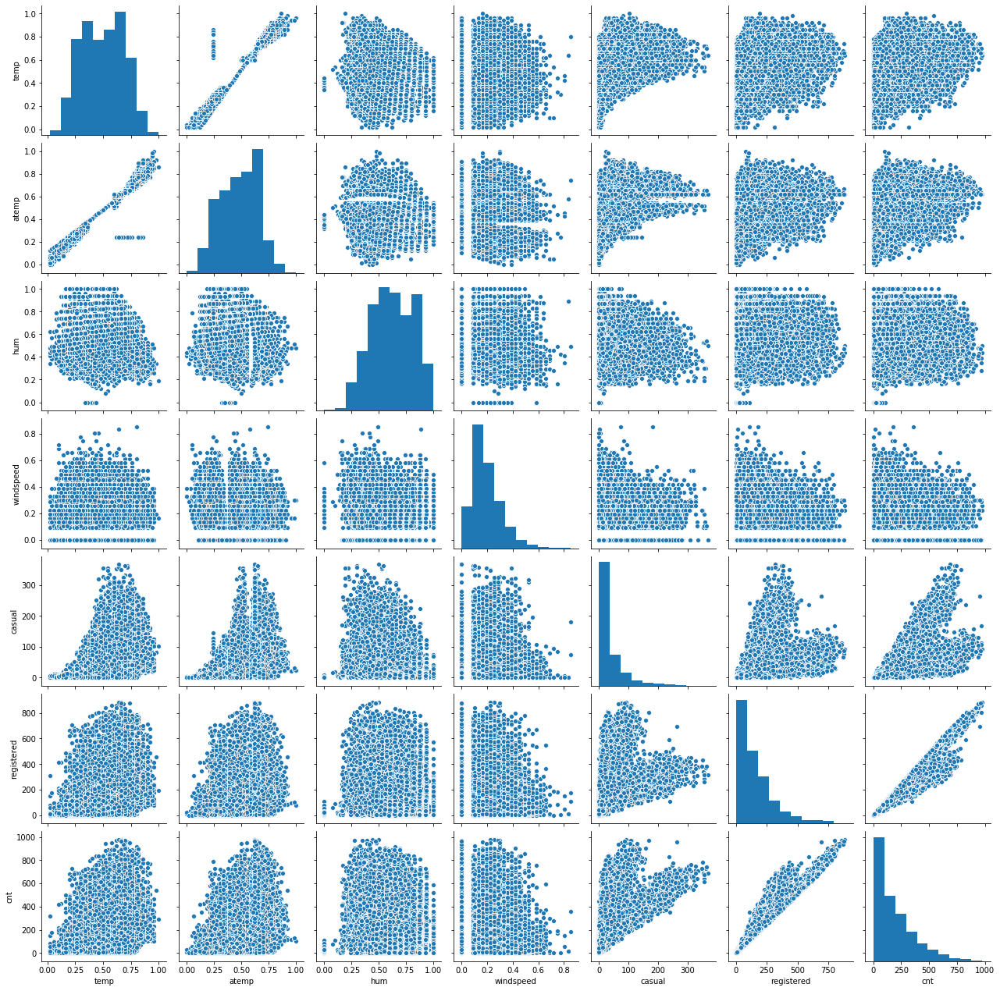

In [405]:
import seaborn as sns
df_scat_mat = df.drop(['holiday','yr','workingday', 'mnth', 'hr', 'weekday', 'season', 'weathersit'], axis=1)
sns.pairplot(df_scat_mat)

We see that cnt is clearly correlated with the count of registered and casual users, as expected. It is also somewhat correlated with temperature (higher temperature tends to imply higher rental) and with windspeed (higher windspeed, less rentals). The parameters 'temp' and 'atemp' are obviously very correlated.

In [406]:
correlation = df_scat_mat.corr()
correlation

,temp,atemp,hum,windspeed,casual,registered,cnt
temp,1.000000,0.987672,-0.069881,-0.023125,0.459616,0.335361,0.404772
atemp,0.987672,1.000000,-0.051918,-0.062336,0.454080,0.332559,0.400929
hum,-0.069881,-0.051918,1.000000,-0.290105,-0.347028,-0.273933,-0.322911
windspeed,-0.023125,-0.062336,-0.290105,1.000000,0.090287,0.082321,0.093234
casual,0.459616,0.454080,-0.347028,0.090287,1.000000,0.506618,0.694564
registered,0.335361,0.332559,-0.273933,0.082321,0.506618,1.000000,0.972151
cnt,0.404772,0.400929,-0.322911,0.093234,0.694564,0.972151,1.000000


In [426]:
fig = px.imshow(correlation,template = 'plotly_white', color_continuous_scale='greens', title = 'Correlation matrix non-categorical parameters')
fig.show()

## Regression model

In [840]:
#shuffle the dataset 
from sklearn.utils import shuffle
df = shuffle(df)
df

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,day
2008,2,0,3,13,0,2,1,1,0.34,0.3030,0.25,0.2985,24,80,104,29
3758,2,0,6,12,0,5,1,1,0.84,0.7576,0.44,0.1343,40,167,207,10
5608,3,0,8,14,0,5,1,1,0.80,0.7727,0.59,0.0000,55,164,219,26
7647,4,0,11,6,0,0,0,2,0.42,0.4242,0.67,0.2537,3,6,9,20
9972,1,1,2,13,0,6,0,1,0.32,0.2879,0.31,0.4925,48,178,226,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16879,4,1,12,2,0,2,1,2,0.40,0.4091,0.66,0.3284,0,1,1,11
3392,2,0,5,6,0,4,1,2,0.60,0.5000,1.00,0.0896,4,94,98,26
12197,2,1,5,10,1,1,0,1,0.70,0.6515,0.61,0.0000,189,175,364,28
12374,2,1,6,19,0,1,1,1,0.62,0.6212,0.38,0.4179,91,554,645,4


In [841]:
#split in train, validation and test like 70, 20, 20
train_data = df[:12150]
valid_data = df[12150: 15000]
test_data = df[15000:]

In [842]:
x_train, y_train = train_data.drop(columns = 'cnt').values, train_data['cnt'].values
x_valid, y_valid = valid_data.drop(columns = 'cnt').values, valid_data['cnt'].values
x_test, y_test = test_data.drop(columns = 'cnt').values, test_data['cnt'].values

In [843]:
#Normalization of input features
mean = x_train.mean(axis = 0)
x_train -= mean
std = x_train.std(axis = 0)
x_train /=std

x_valid -= mean
x_valid /= std

x_test -= mean
x_test /= std


Building the model

In [846]:
from keras import models
from keras.layers import Dense
from keras.optimizers import Adam

def my_reg_model():
    
    model = models.Sequential()
    model.add(Dense(32, activation = 'relu', input_shape = (x_train.shape[1],) ))
    model.add(Dense(64, activation = 'relu') )
    model.add(Dense(64, activation = 'relu') )


    model.add(Dense(1))
    
    model.compile(optimizer = Adam(learning_rate=0.001), loss = 'mse', metrics = ['mae'])

    return model


In [847]:
model = my_reg_model()
model.summary()

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_92 (Dense)             (None, 32)                512       
_________________________________________________________________
dense_93 (Dense)             (None, 64)                2112      
_________________________________________________________________
dense_94 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_95 (Dense)             (None, 1)                 65        
Total params: 6,849
Trainable params: 6,849
Non-trainable params: 0
_________________________________________________________________


In [848]:
from keras.callbacks import ModelCheckpoint, EarlyStopping, LambdaCallback

checkpointer = ModelCheckpoint(filepath='bikes.model.hdf5', save_best_only=True, verbose = 1)
#early_stop = EarlyStopping(monitor='val_loss', patience=20)
lambda_call= LambdaCallback(on_batch_end=lambda batch,logs:print(logs))

history = model.fit(x_train, y_train, validation_data = (x_valid, y_valid),epochs = 600, batch_size = 512, verbose = 1, callbacks=[checkpointer, lambda_call])

Epoch 1/600
 1/24 [>.............................] - ETA: 8s - loss: 72273.2969 - mae: 197.2472{'loss': 72273.296875, 'mae': 197.24717712402344}
{'loss': 73556.8203125, 'mae': 198.83425903320312}
{'loss': 73688.0234375, 'mae': 197.66082763671875}
{'loss': 70290.6640625, 'mae': 192.6378936767578}
{'loss': 71172.4140625, 'mae': 193.9121551513672}
{'loss': 70382.609375, 'mae': 192.66380310058594}
{'loss': 68391.1484375, 'mae': 189.3940887451172}
{'loss': 68865.25, 'mae': 190.20358276367188}
{'loss': 69250.984375, 'mae': 190.52352905273438}
{'loss': 68884.3203125, 'mae': 190.06979370117188}
{'loss': 68649.96875, 'mae': 189.47515869140625}
{'loss': 69367.5546875, 'mae': 190.41929626464844}
{'loss': 69525.1171875, 'mae': 190.25851440429688}
{'loss': 69083.1171875, 'mae': 189.5195770263672}
{'loss': 69064.2890625, 'mae': 189.33102416992188}
{'loss': 68870.5703125, 'mae': 188.76107788085938}
{'loss': 68656.6015625, 'mae': 188.444091796875}
{'loss': 68296.296875, 'mae': 188.0961456298828}
{'los

In [849]:
#plot training and validation loss function and accuracy
def plot_fit_res(history):

    #history object has a member history which is a dictionary containing fit info
    history_dict = history.history
    print(f'Fit keys: { history_dict.keys()}') 

    fig, (ax1,ax2) = plt.subplots(1,2, figsize =(12, 7))

    #loss
    loss_values = history_dict['loss']
    val_loss_values = history_dict['val_loss']
    epochs = np.arange(1, len(loss_values) + 1)

    ax1.plot(epochs, loss_values, 'bo', label = 'Training loss')
    ax1.plot(epochs, val_loss_values, 'ro', label = 'Validation loss')
    ax1.set_title('Training and validation loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.set_ylim([0, 1])    
    #mae
    mae_values = history_dict['mae']
    val_mae_values = history_dict['val_mae']

    ax2.plot(epochs, mae_values, 'bo', label = 'Training mae')
    ax2.plot(epochs, val_mae_values, 'ro', label = 'Validation mae')
    ax2.set_title('Training and validation mae')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('MAE')
    ax2.legend()
    ax2.set_ylim([0, 1])    


    plt.show()


Fit keys: dict_keys(['loss', 'mae', 'val_loss', 'val_mae'])


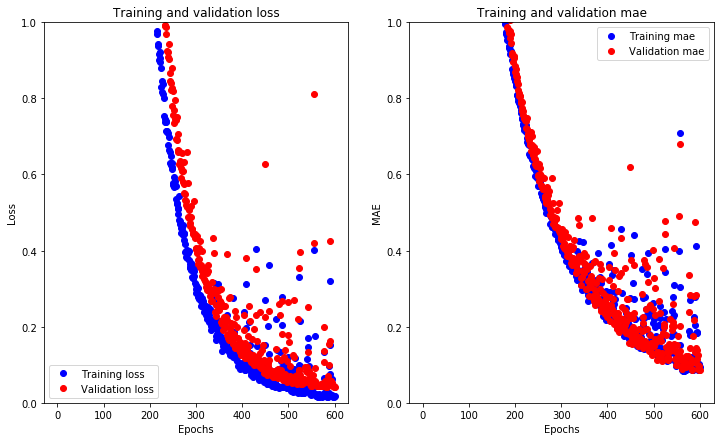

In [850]:
plot_fit_res(history)

Load the weights of the minimum validation loss and use that best model on the test data.

In [853]:
best_model = my_reg_model()
best_model.load_weights('bikes.model.hdf5')

In [856]:
print('\nTesting mean squared deviation: {:.4f}\nTesting mean absolute deviation: {:.4f}'.format(*best_model.evaluate(x_test, y_test)))

75/75 [==============================] - 0s 692us/step - loss: 0.0167 - mae: 0.0820

Testing mean squared deviation: 0.0167
Testing mean absolute deviaion: 0.0820


In [865]:
y_cnt_predic = np.squeeze(best_model.predict(x_test))

df_cnt = pd.DataFrame()
df_cnt['Predicted cnt'] = y_cnt_predic
df_cnt['True cnt'] = y_test